In [1]:
import warnings
warnings.filterwarnings('ignore')

# Import our dependencies
import numpy as np
import pandas as pd
import xarray as xr

import os
from dotenv import load_dotenv
from pymongo import MongoClient

from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA, IncrementalPCA, KernelPCA, FastICA
from sklearn.cluster import Birch
from sklearn.metrics import silhouette_samples, silhouette_score

import arviz as az
import hvplot.pandas
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import seaborn as sns
import sweetviz as sv

In [2]:
# load the config from the .env file
load_dotenv()
MONGODB_URI = os.environ['MONGODB_URI']

In [3]:
# Connect to the database engine
client = MongoClient(MONGODB_URI)

In [4]:
# connect to the project db
db = client['ExpectLife']

In [5]:
# get a reference to the data collection
data_list = db['clustering_final_system_list_input']

In [6]:
# Create a dataframe from the collection
combined_df = pd.DataFrame(list(data_list.find()))
combined_df

,_id,country,sss_depth,system_type,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018)
0,63b2f645bb145e84e7b2417a,Albania,2,"['Universal medical benefits','Social insuranc...",1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0
1,63b2f645bb145e84e7b2417b,Algeria,1,['Social insurance system'],1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0
2,63b2f645bb145e84e7b2417c,Argentina,3,"['Universal medical benefits','Social insuranc...",4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0
3,63b2f645bb145e84e7b2417d,Armenia,3,['Universal (birth or adoption grant and medic...,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0
4,63b2f645bb145e84e7b2417e,Australia,3,"['Universal medical benefits','Employment-rela...",1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,63b2f645bb145e84e7b241fa,Uzbekistan,2,"['Universal medical benefits','Social insuranc...",6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0
129,63b2f645bb145e84e7b241fb,Vietnam,1,['Social insurance system'],3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0
130,63b2f645bb145e84e7b241fc,Yemen,2,"['Universal medical benefits','Employer-liabil...",2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0
131,63b2f645bb145e84e7b241fd,Zambia,2,"['Universal medical benefits','Employer-liabil...",2.120306e+04,62.45,65.37,59.54,19.5,77.16,31.21,2.13,6.54,14.6,45.99,9.23,2002.0


In [7]:
# Drop the database id data and refresh the index
combined_df = combined_df.drop(['_id'], axis=1)
combined_df = combined_df.reset_index(drop=True)
combined_df

,country,sss_depth,system_type,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018)
0,Albania,2,"['Universal medical benefits','Social insuranc...",1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0
1,Algeria,1,['Social insurance system'],1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0
2,Argentina,3,"['Universal medical benefits','Social insuranc...",4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0
3,Armenia,3,['Universal (birth or adoption grant and medic...,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0
4,Australia,3,"['Universal medical benefits','Employment-rela...",1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,Uzbekistan,2,"['Universal medical benefits','Social insuranc...",6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0
129,Vietnam,1,['Social insurance system'],3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0
130,Yemen,2,"['Universal medical benefits','Employer-liabil...",2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0
131,Zambia,2,"['Universal medical benefits','Employer-liabil...",2.120306e+04,62.45,65.37,59.54,19.5,77.16,31.21,2.13,6.54,14.6,45.99,9.23,2002.0


In [8]:
# Create a new DataFrame for the country names.  Apply the country names as the new index for later merging.
country_df = pd.DataFrame()
country_df['country'] = combined_df['country']
country_df = country_df.set_index('country', drop=False)
country_df

,country
country,
Albania,Albania
Algeria,Algeria
Argentina,Argentina
Armenia,Armenia
Australia,Australia
...,...
Uzbekistan,Uzbekistan
Vietnam,Vietnam
Yemen,Yemen


In [9]:
# Set the DataFrame index to the country names to get them out of the way
combined_df = combined_df.set_index('country')
combined_df

,sss_depth,system_type,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018)
country,,,,,,,,,,,,,,,
Albania,2,"['Universal medical benefits','Social insuranc...",1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0
Algeria,1,['Social insurance system'],1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0
Argentina,3,"['Universal medical benefits','Social insuranc...",4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0
Armenia,3,['Universal (birth or adoption grant and medic...,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0
Australia,3,"['Universal medical benefits','Employment-rela...",1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,2,"['Universal medical benefits','Social insuranc...",6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0
Vietnam,1,['Social insurance system'],3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0
Yemen,2,"['Universal medical benefits','Employer-liabil...",2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0


# Encoding

In [10]:
# Use get_dummies() to create variables for text features.
encode_df = pd.get_dummies(combined_df, columns=['system_type'])
encode_df

,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,...,"system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (maternity benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (medical benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (parental leave)']","system_type_['Universal medical benefits','Social insurance (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash maternity and medical benefits)','Employer-liability (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash maternity and medical benefits)','Employer-liability (cash sickness benefit)']","system_type_['Universal medical benefits','Social insurance (cash maternity benefit)','Employer-liability (cash sickness and medical benefits)']","system_type_['Universal medical benefits','Social insurance system']","system_type_['Universal medical benefits','Social insurance','Social assistance (cash benefits)']"
country,,,,,,,,,,,,,,,,,,,,,
Albania,2,1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,...,0,0,0,0,1,0,0,0,0,0
Algeria,1,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,...,0,0,0,0,0,0,0,0,0,0
Argentina,3,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,...,0,0,0,0,0,0,1,0,0,0
Armenia,3,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,...,0,0,0,0,0,0,0,0,0,0
Australia,3,1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,2,6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,...,0,0,0,0,1,0,0,0,0,0
Vietnam,1,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,...,0,0,0,0,0,0,0,0,0,0
Yemen,2,2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,...,0,0,0,0,0,0,0,0,0,0


In [11]:
# Collect the column labels so they can be reapplied after data scaling
col_names = encode_df.columns.tolist()

# Robust Scaling

In [12]:
# Standardize the data with RobustScaler().
scaler = RobustScaler()

encode_scaled_nda = scaler.fit_transform(encode_df)
encode_scaled_nda

array([[ 0.        , -0.13699738,  0.33183453, ...,  0.        ,
         0.        ,  0.        ],
       [-1.        ,  0.29716901,  0.25359712, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        ,  1.23528063,  0.20413669, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        , -0.12887318, -0.69064748, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , -0.12846324, -1.06654676, ...,  0.        ,
         0.        ,  0.        ],
       [-1.        , -0.11392173, -1.22571942, ...,  0.        ,
         0.        ,  0.        ]])

In [13]:
# Convert the scaled-encoded data back to a DataFrame (nda = Numpy Data Array)

scale_encode_df = pd.DataFrame(encode_scaled_nda, index=encode_df.index)
scale_encode_df

,0,1,2,3,4,5,6,7,8,9,...,76,77,78,79,80,81,82,83,84,85
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.136997,0.331835,0.181741,0.467412,-0.267516,-0.035080,-0.019051,-0.190184,0.114826,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Algeria,-1.0,0.297169,0.253597,0.030431,0.465549,1.085987,0.025656,-0.104235,0.190184,-0.789244,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.235281,0.204137,0.147084,0.212291,1.105096,0.588930,0.660836,0.763804,0.475291,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Armenia,1.0,-0.149753,0.154676,0.118343,0.117318,-0.264331,-0.157522,1.450042,-0.622699,-0.120640,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,1.0,4.283451,0.785072,0.598478,0.932961,0.471338,2.134396,1.586284,1.122699,0.600291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.010831,-0.116906,-0.215554,-0.043762,0.735669,-0.174513,-0.129341,-0.337423,-0.550872,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Vietnam,-1.0,0.861627,-0.051259,0.029586,-0.155493,2.792994,-0.129283,-0.040891,-0.349693,0.331395,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.128873,-0.690647,-0.747253,-0.635009,0.633758,-0.278210,-0.339397,-0.923313,-0.920058,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
# Apply the column labels to ensure the data is properly identified
scale_encode_df = scale_encode_df.set_axis(col_names, axis=1)
scale_encode_df

,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,...,"system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (maternity benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (medical benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (parental leave)']","system_type_['Universal medical benefits','Social insurance (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash maternity and medical benefits)','Employer-liability (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash maternity and medical benefits)','Employer-liability (cash sickness benefit)']","system_type_['Universal medical benefits','Social insurance (cash maternity benefit)','Employer-liability (cash sickness and medical benefits)']","system_type_['Universal medical benefits','Social insurance system']","system_type_['Universal medical benefits','Social insurance','Social assistance (cash benefits)']"
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.136997,0.331835,0.181741,0.467412,-0.267516,-0.035080,-0.019051,-0.190184,0.114826,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Algeria,-1.0,0.297169,0.253597,0.030431,0.465549,1.085987,0.025656,-0.104235,0.190184,-0.789244,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.235281,0.204137,0.147084,0.212291,1.105096,0.588930,0.660836,0.763804,0.475291,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Armenia,1.0,-0.149753,0.154676,0.118343,0.117318,-0.264331,-0.157522,1.450042,-0.622699,-0.120640,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,1.0,4.283451,0.785072,0.598478,0.932961,0.471338,2.134396,1.586284,1.122699,0.600291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.010831,-0.116906,-0.215554,-0.043762,0.735669,-0.174513,-0.129341,-0.337423,-0.550872,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Vietnam,-1.0,0.861627,-0.051259,0.029586,-0.155493,2.792994,-0.129283,-0.040891,-0.349693,0.331395,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.128873,-0.690647,-0.747253,-0.635009,0.633758,-0.278210,-0.339397,-0.923313,-0.920058,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Feature Selection

In [15]:
# Define the variance threshold (1%)
sel = VarianceThreshold(threshold=0.01)

# Apply the variance threshold to the scale_encode_df DataFrame
new_se = sel.fit_transform(scale_encode_df)

In [16]:
# Create feature-reduce DataFrame
new_se_df = pd.DataFrame(new_se, index=scale_encode_df.index)
new_se_df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.136997,0.331835,0.181741,0.467412,-0.267516,-0.035080,-0.019051,-0.190184,0.114826,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Algeria,-1.0,0.297169,0.253597,0.030431,0.465549,1.085987,0.025656,-0.104235,0.190184,-0.789244,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.235281,0.204137,0.147084,0.212291,1.105096,0.588930,0.660836,0.763804,0.475291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
Armenia,1.0,-0.149753,0.154676,0.118343,0.117318,-0.264331,-0.157522,1.450042,-0.622699,-0.120640,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,1.0,4.283451,0.785072,0.598478,0.932961,0.471338,2.134396,1.586284,1.122699,0.600291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.010831,-0.116906,-0.215554,-0.043762,0.735669,-0.174513,-0.129341,-0.337423,-0.550872,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Vietnam,-1.0,0.861627,-0.051259,0.029586,-0.155493,2.792994,-0.129283,-0.040891,-0.349693,0.331395,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.128873,-0.690647,-0.747253,-0.635009,0.633758,-0.278210,-0.339397,-0.923313,-0.920058,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [17]:
# Apply the column labels to the feature-reduced DataFrame
new_se_df.columns = sel.get_feature_names_out(col_names)
new_se_df

,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,...,system_type_['Employer-liability system (cash sickness and maternity benefits)'],system_type_['Employer-liability system'],"system_type_['Social insurance (cash and medical benefits)','Social assistance (medical benefits)']",system_type_['Social insurance and social assistance system'],system_type_['Social insurance system'],system_type_['Universal and Social insurance system'],"system_type_['Universal medical benefits','Employer-liability (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)','Social assistance (medical benefits)']","system_type_['Universal medical benefits','Social insurance (cash benefits)']","system_type_['Universal medical benefits','Social insurance (cash maternity and medical benefits)','Employer-liability (cash sickness benefit)']"
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.136997,0.331835,0.181741,0.467412,-0.267516,-0.035080,-0.019051,-0.190184,0.114826,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Algeria,-1.0,0.297169,0.253597,0.030431,0.465549,1.085987,0.025656,-0.104235,0.190184,-0.789244,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.235281,0.204137,0.147084,0.212291,1.105096,0.588930,0.660836,0.763804,0.475291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
Armenia,1.0,-0.149753,0.154676,0.118343,0.117318,-0.264331,-0.157522,1.450042,-0.622699,-0.120640,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,1.0,4.283451,0.785072,0.598478,0.932961,0.471338,2.134396,1.586284,1.122699,0.600291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.010831,-0.116906,-0.215554,-0.043762,0.735669,-0.174513,-0.129341,-0.337423,-0.550872,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Vietnam,-1.0,0.861627,-0.051259,0.029586,-0.155493,2.792994,-0.129283,-0.040891,-0.349693,0.331395,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.128873,-0.690647,-0.747253,-0.635009,0.633758,-0.278210,-0.339397,-0.923313,-0.920058,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


## PCA

In [18]:
# Initialize the parameters with starter values
n_comp = 3 #:n_components - used for PCA
rs = 42  #:random_state

In [19]:
# Using PCA to reduce dimension to the principal components.
pca = PCA(n_components=n_comp, random_state=rs)

# Get principal components for the feature-reduced demographics data
demo_pca = pca.fit_transform(new_se)
demo_pca

array([[-2.05754979e+00, -3.35620046e-02,  3.79437187e-01],
       [-7.27717793e-01,  6.58169032e-01,  1.94001107e-01],
       [-1.44819805e-01, -6.18256591e-01,  1.05272878e+00],
       [-2.07884541e+00,  7.56061363e-03,  2.62448538e-01],
       [ 1.34419840e+00, -3.86604473e+00,  1.49152829e+00],
       [-1.02434780e+00, -2.15391490e+00,  2.89880961e+00],
       [-1.81883213e+00,  5.13779222e-01, -6.98675588e-01],
       [-2.18458717e+00, -8.86357320e-02,  1.53673169e-01],
       [ 2.69527469e+00,  2.93751049e+00,  5.41454153e-02],
       [-2.17821336e+00, -6.69577582e-03,  1.49887609e-01],
       [-1.82170907e+00, -9.43472850e-02,  5.57177531e-01],
       [-7.37796230e-01, -2.29809710e+00,  2.64310267e+00],
       [-2.17901905e+00,  2.72861962e-01, -4.02115664e-01],
       [-1.87890866e+00,  1.14646129e+00, -1.95631365e+00],
       [-1.84816607e+00,  4.22476749e-01, -6.06871199e-01],
       [-2.14178506e+00,  5.80178666e-01, -1.28100993e+00],
       [ 6.06865959e+00,  6.36270299e-01

In [20]:
# Create a DataFrame with the principal components.
columnz =[]

for i in range(1,n_comp+1):
    columnz.append('pc'+str(i))

pcs_df = pd.DataFrame(data=demo_pca, columns=columnz, index=new_se_df.index)
pcs_df

,pc1,pc2,pc3
country,,,
Albania,-2.057550,-0.033562,0.379437
Algeria,-0.727718,0.658169,0.194001
Argentina,-0.144820,-0.618257,1.052729
Armenia,-2.078845,0.007561,0.262449
Australia,1.344198,-3.866045,1.491528
...,...,...,...
Uzbekistan,-1.215178,0.900592,-0.493650
Vietnam,0.918523,1.376059,0.271669
Yemen,-1.420060,1.468616,-1.660362


## Compute Silhouette scores and plots

In [37]:
# BIRCH parameters
th = .01  #:threshold - setting this low promotes branching
bf = 2  #:branching factor (default is 50) - max number of CF subclusters in each node.

For n_clusters = 2 The average silhouette_score is : 0.9246627671133498
For n_clusters = 3 The average silhouette_score is : 0.9051906807060273
For n_clusters = 4 The average silhouette_score is : 0.6172258044342959
For n_clusters = 5 The average silhouette_score is : 0.41988585767455555
For n_clusters = 6 The average silhouette_score is : 0.4450075512829464
For n_clusters = 7 The average silhouette_score is : 0.4463079665400434
For n_clusters = 8 The average silhouette_score is : 0.44504254940077465
For n_clusters = 9 The average silhouette_score is : 0.38313161713171456


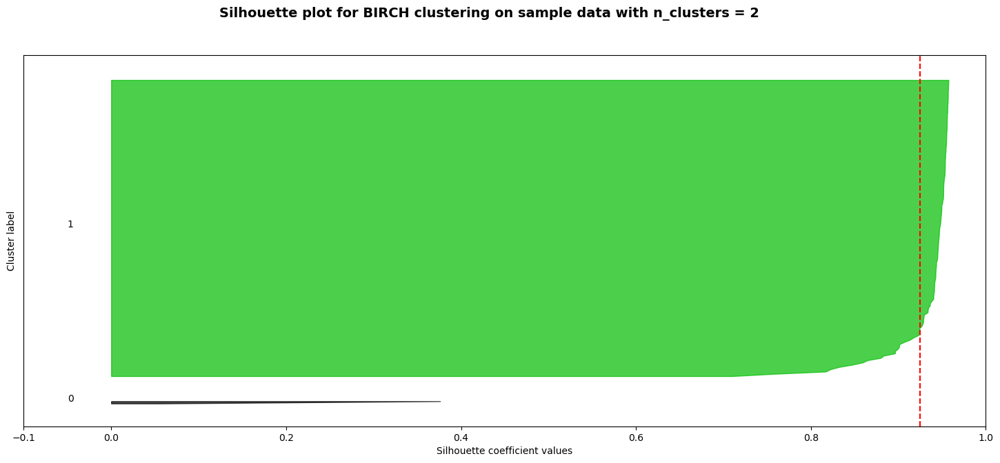

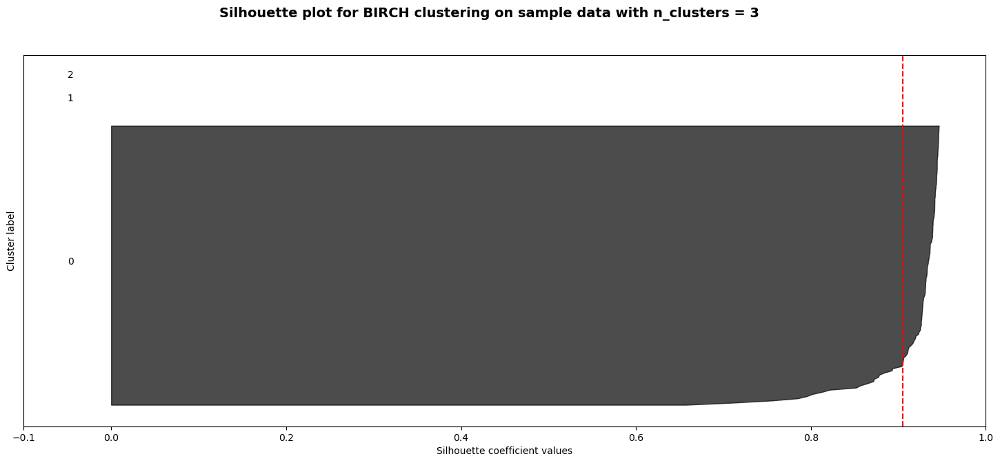

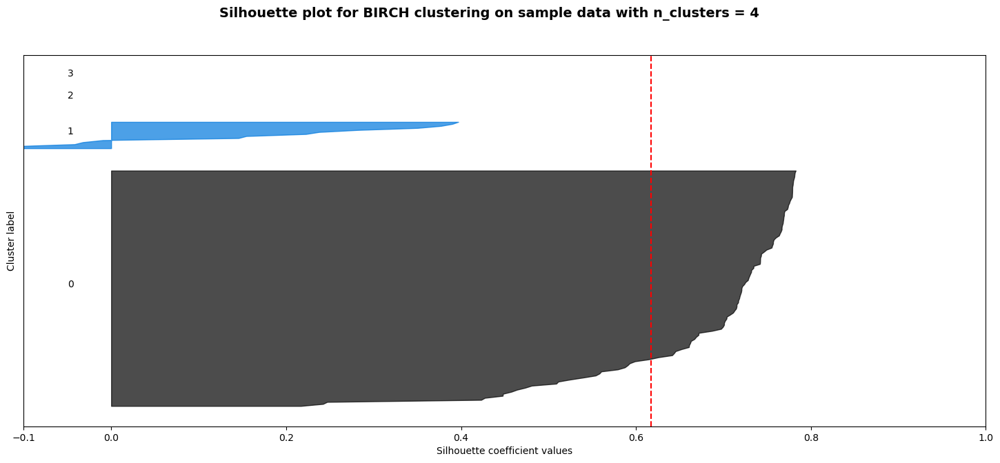

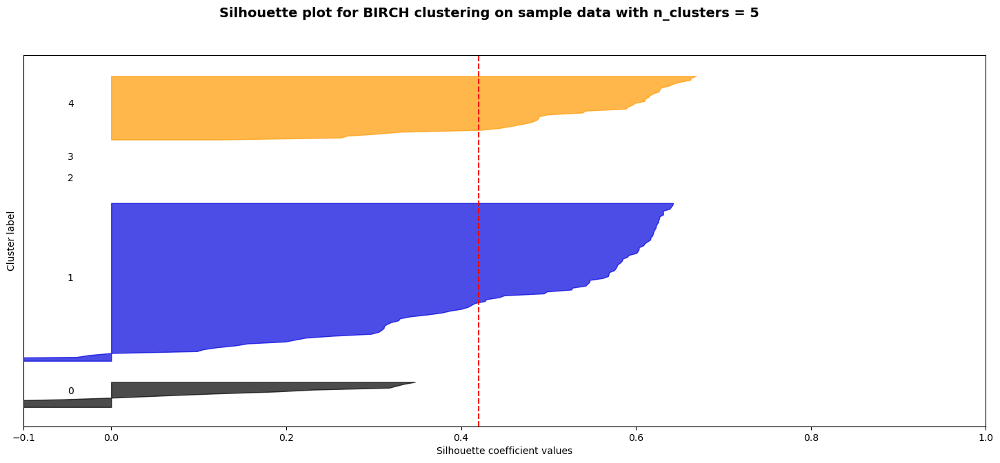

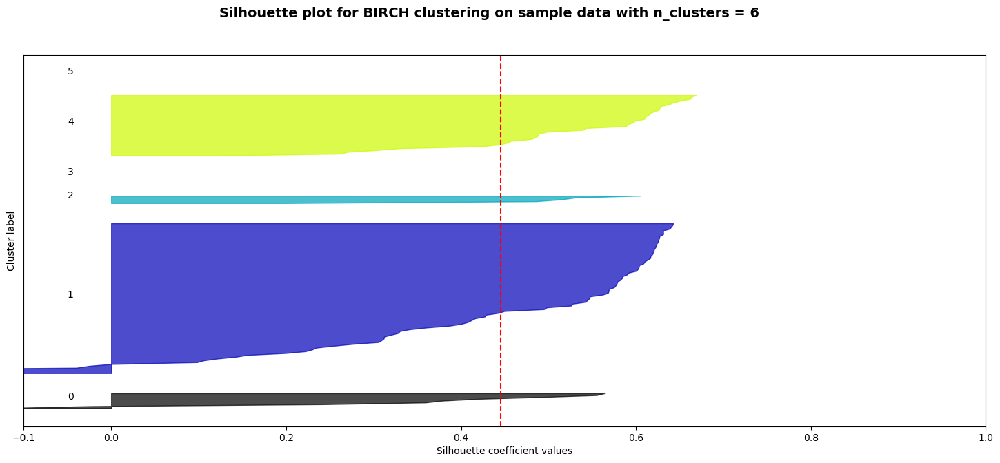

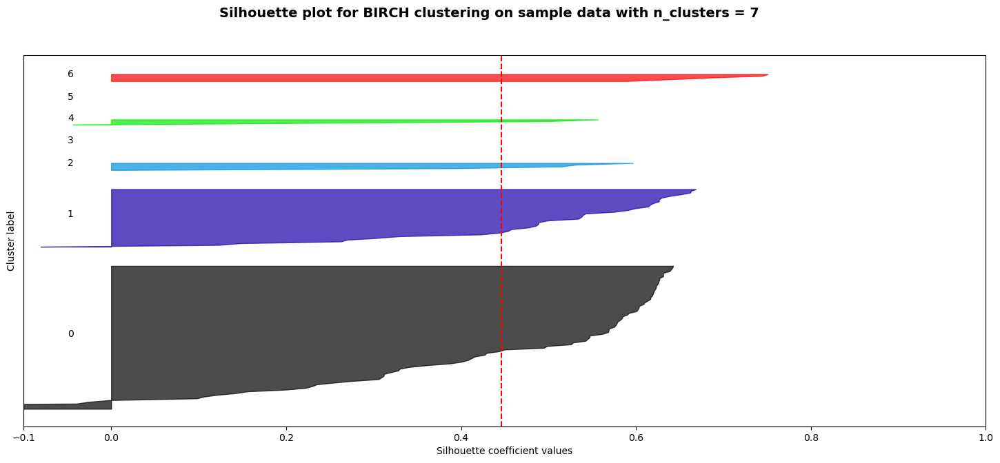

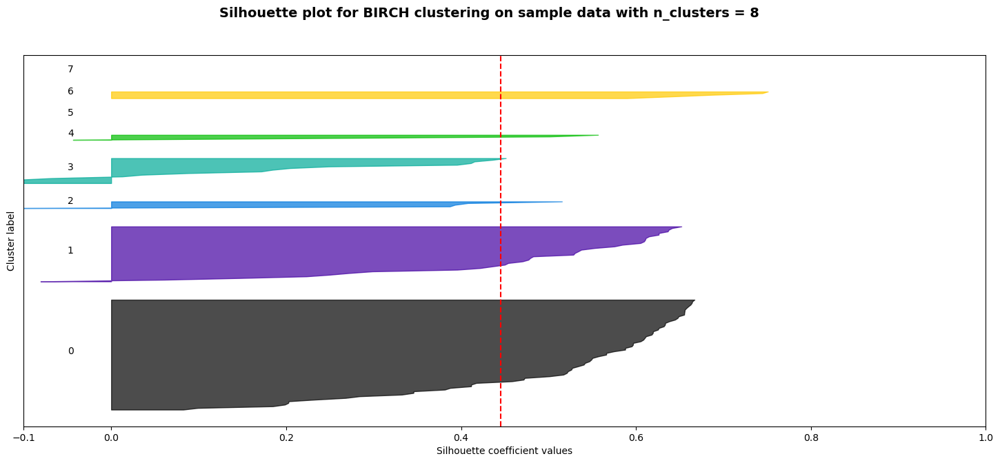

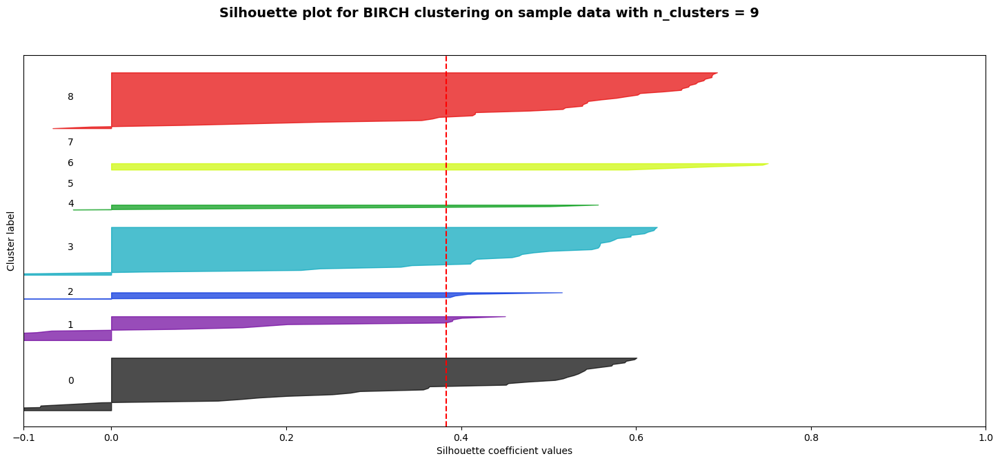

In [38]:
# Generate Silhouette scores and plot them
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot. The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pcs_df) + (n_clusters + 1) * 10])
    
    # Initialize the clusterer with n_clusters value
    clusterer = Birch(threshold=th, branching_factor=bf, n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(pcs_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(pcs_df, cluster_labels)
    print("For n_clusters =",n_clusters,"The average silhouette_score is :",silhouette_avg,)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pcs_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

 # ax2 code here

    plt.suptitle(
        "Silhouette plot for BIRCH clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [39]:
# Initialize the parameters for the model below
nc = 3  #:n_clusters - default is 3

# Use the Threshold and Branching values passed into the Silhouette plotting for consistency.

## BIRCH

In [40]:
# define the model
model = Birch(threshold=th, branching_factor=bf, n_clusters=nc)

# Create a copy of the pcs_df for processing below
b_pcs_df = pcs_df.copy()

# Fit the model - Make predictions
pred = model.fit_predict(b_pcs_df)

# Add the predicted class columns
b_pcs_df['class'] = model.labels_
b_pcs_df.head()

,pc1,pc2,pc3,class
country,,,,
Albania,-2.057550,-0.033562,0.379437,0
Algeria,-0.727718,0.658169,0.194001,0
Argentina,-0.144820,-0.618257,1.052729,0
Armenia,-2.078845,0.007561,0.262449,0
Australia,1.344198,-3.866045,1.491528,0


In [41]:
# Create a new DataFrame including predicted clusters and demographic features.
frames = [country_df, combined_df, b_pcs_df]
clustered_df = pd.concat(frames, axis=1, join='outer')
clustered_df.index = pcs_df.index

# Drop the string column
clustered_df = clustered_df.drop(['system_type'], axis=1)

# Print the shape of the clustered_df
print(clustered_df.shape)
clustered_df

(133, 19)


,country,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018),pc1,pc2,pc3,class
country,,,,,,,,,,,,,,,,,,,
Albania,Albania,2,1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0,-2.057550,-0.033562,0.379437,0
Algeria,Algeria,1,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0,-0.727718,0.658169,0.194001,0
Argentina,Argentina,3,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0,-0.144820,-0.618257,1.052729,0
Armenia,Armenia,3,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0,-2.078845,0.007561,0.262449,0
Australia,Australia,3,1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0,1.344198,-3.866045,1.491528,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,Uzbekistan,2,6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0,-1.215178,0.900592,-0.493650,0
Vietnam,Vietnam,1,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0,0.918523,1.376059,0.271669,0
Yemen,Yemen,2,2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0,-1.420060,1.468616,-1.660362,0


In [42]:
# Creating a Scatter with the scale_encode_df data and the clusters
fig = px.scatter_3d(clustered_df, x='sss_depth', y='tot_alcohol_consumption', z='govt_he_gdp', color='class', hover_name='country', hover_data=['both_sexes_lex','population','GDP(M$)'], width=800)
fig.show()

In [43]:
# Creating a Scatter with the scale_encode_df data and the clusters
fig = px.scatter_3d(clustered_df, x='tot_alcohol_consumption', y='private_he', z='govt_he',size='both_sexes_lex', color='class',symbol='sss_depth', hover_name='country', hover_data=['both_sexes_lex','population','GDP(M$)'], width=800)
fig.show()

In [44]:
# Create the inference data for the autocorrelation plot
clustered_list_df = clustered_df.copy()

data_list = clustered_list_df[['sss_depth', 'both_sexes_lex']].values

df = pd.DataFrame({'a':data_list[:,0], 'b':data_list[:,1]})
df["chain"] = 0
df["draw"] = np.arange(len(df), dtype=int)
df = df.set_index(["chain", "draw"])
xdata = xr.Dataset.from_dataframe(df)

dataset_list = az.InferenceData(posterior=xdata)
dataset_list

Inference data with groups:
	> posterior

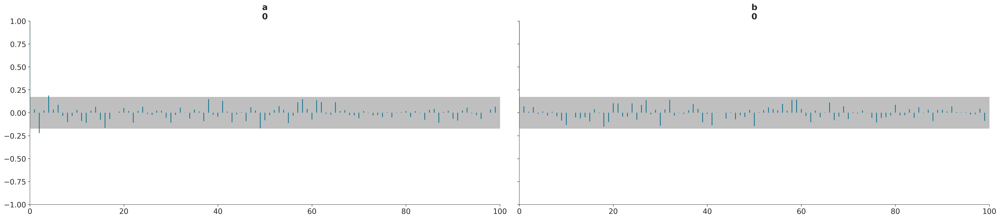

In [45]:
# Create an autocorrelation plot
az.style.use("arviz-doc")

az.plot_autocorr(dataset_list, var_names=('a', 'b'))

plt.show()

In [46]:
# Create a hvplot.scatter plot.
sizez = clustered_df['sss_depth'] * 30

clustered_df.hvplot.scatter(x='class', y='both_sexes_lex', label='List BIRCH', size=sizez, hover_cols=['country'], line_color='#c994c7', hover_line_color='magenta', by='class')

:NdOverlay   [class]
   :Scatter   [class]   (both_sexes_lex,_size,country)

In [47]:
# Create a hvplot.scatter plot.
sizez = clustered_df['sss_depth'] * 30

clustered_df.hvplot.scatter(x='tot_alcohol_consumption', y='both_sexes_lex', label='List BIRCH', size=sizez, hover_cols=['country'], line_color='#c994c7', hover_line_color='magenta', by='class')

:NdOverlay   [class]
   :Scatter   [tot_alcohol_consumption]   (both_sexes_lex,_size,country)

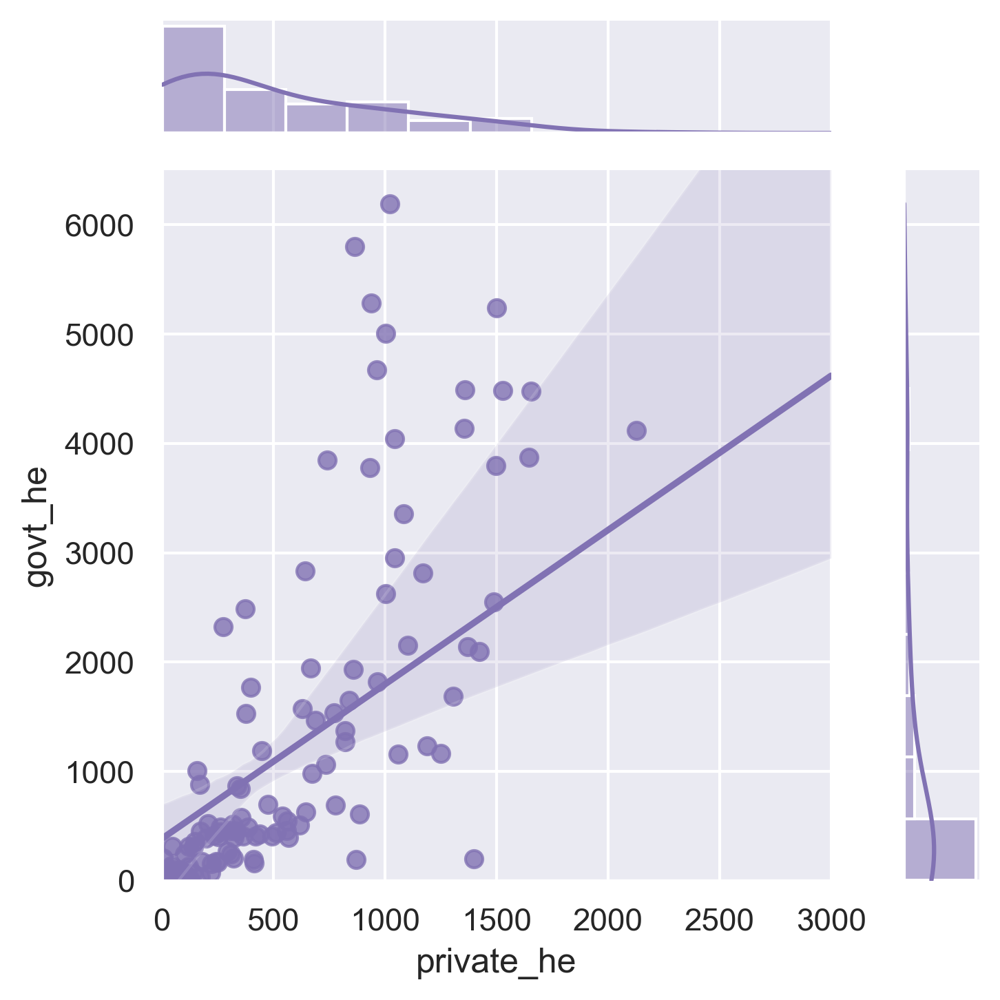

In [48]:
sns.set_theme(style="darkgrid")

g = sns.jointplot(x='private_he', y='govt_he', data=clustered_df,
                  kind="reg", truncate=False,
                  xlim=(0, 3000), ylim=(0, 6500),
                  color='m', height=5)

## Coded Input

In [49]:
# get a reference to the data collection
data_code = db['clustering_final_system_coded_input']

In [50]:
# Create a dataframe from the collection
combined_c_df = pd.DataFrame(list(data_code.find()))
combined_c_df

,_id,country,sss_depth,s1,s2,GDP(M$),both_sexes_lex,female_lex,male_lex,population,...,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018),s3,s4,s5
0,63b2f997bb145e84e7b24200,Albania,2,Universal medical benefits,Social insurance (cash benefits),1.826004e+04,78.00,79.91,76.25,2.9,...,324.65,2.82,7.17,23.0,52.00,59.42,3360.0,NaN,NaN,NaN
1,63b2f997bb145e84e7b24201,Algeria,1,Social insurance system,NaN,1.679831e+05,77.13,78.12,76.23,45.4,...,262.32,4.06,0.95,21.0,66.97,24.99,3322.0,NaN,NaN,NaN
2,63b2f997bb145e84e7b24202,Argentina,3,Universal medical benefits,Social insurance (cash maternity and medical b...,4.914927e+05,76.58,79.50,73.51,46.0,...,822.13,5.93,9.65,24.9,35.70,66.94,3307.0,Employer-liability (cash sickness benefit),NaN,NaN
3,63b2f997bb145e84e7b24203,Armenia,3,Universal (birth or adoption grant and medical...,Social insurance (cash benefits),1.386118e+04,76.03,79.16,72.49,3.0,...,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0,Social assistance (maternity benefits),NaN,NaN
4,63b2f997bb145e84e7b24204,Australia,3,Universal medical benefits,Employment-related (parental benefits),1.542660e+06,83.04,84.84,81.25,26.1,...,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0,Social assistance (cash sickness benefits and ...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,63b2f997bb145e84e7b2427f,Uzbekistan,2,Universal medical benefits,Social insurance (cash benefits),6.923890e+04,73.01,75.21,70.76,34.4,...,243.95,2.34,2.59,17.8,54.24,29.19,3011.0,NaN,NaN,NaN
128,63b2f997bb145e84e7b24280,Vietnam,1,Social insurance system,NaN,3.626375e+05,73.74,78.11,69.56,99.0,...,308.67,2.30,8.66,25.0,50.56,31.05,3025.0,NaN,NaN,NaN
129,63b2f997bb145e84e7b24281,Yemen,2,Universal medical benefits,Employer-liability (cash benefits),2.106169e+04,66.63,68.92,64.41,31.2,...,90.25,0.43,0.05,20.5,45.06,13.88,2154.0,NaN,NaN,NaN
130,63b2f997bb145e84e7b24282,Zambia,2,Universal medical benefits,Employer-liability (cash benefits),2.120306e+04,62.45,65.37,59.54,19.5,...,31.21,2.13,6.54,14.6,45.99,9.23,2002.0,NaN,NaN,NaN


In [51]:
# Drop the database id data and refresh the index
combined_c_df = combined_c_df.drop(['_id'], axis=1)
combined_c_df = combined_c_df.reset_index(drop=True)
combined_c_df

,country,sss_depth,s1,s2,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018),s3,s4,s5
0,Albania,2,Universal medical benefits,Social insurance (cash benefits),1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0,NaN,NaN,NaN
1,Algeria,1,Social insurance system,NaN,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0,NaN,NaN,NaN
2,Argentina,3,Universal medical benefits,Social insurance (cash maternity and medical b...,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0,Employer-liability (cash sickness benefit),NaN,NaN
3,Armenia,3,Universal (birth or adoption grant and medical...,Social insurance (cash benefits),1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0,Social assistance (maternity benefits),NaN,NaN
4,Australia,3,Universal medical benefits,Employment-related (parental benefits),1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0,Social assistance (cash sickness benefits and ...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,Uzbekistan,2,Universal medical benefits,Social insurance (cash benefits),6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0,NaN,NaN,NaN
128,Vietnam,1,Social insurance system,NaN,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0,NaN,NaN,NaN
129,Yemen,2,Universal medical benefits,Employer-liability (cash benefits),2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0,NaN,NaN,NaN
130,Zambia,2,Universal medical benefits,Employer-liability (cash benefits),2.120306e+04,62.45,65.37,59.54,19.5,77.16,31.21,2.13,6.54,14.6,45.99,9.23,2002.0,NaN,NaN,NaN


In [52]:
# Set the DataFrame index to the country names to get them out of the way
combined_c_df = combined_c_df.set_index('country')
combined_c_df

,sss_depth,s1,s2,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018),s3,s4,s5
country,,,,,,,,,,,,,,,,,,,
Albania,2,Universal medical benefits,Social insurance (cash benefits),1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0,NaN,NaN,NaN
Algeria,1,Social insurance system,NaN,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0,NaN,NaN,NaN
Argentina,3,Universal medical benefits,Social insurance (cash maternity and medical b...,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0,Employer-liability (cash sickness benefit),NaN,NaN
Armenia,3,Universal (birth or adoption grant and medical...,Social insurance (cash benefits),1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0,Social assistance (maternity benefits),NaN,NaN
Australia,3,Universal medical benefits,Employment-related (parental benefits),1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0,Social assistance (cash sickness benefits and ...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,2,Universal medical benefits,Social insurance (cash benefits),6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0,NaN,NaN,NaN
Vietnam,1,Social insurance system,NaN,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0,NaN,NaN,NaN
Yemen,2,Universal medical benefits,Employer-liability (cash benefits),2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0,NaN,NaN,NaN


# Coded - Encoding

In [53]:
# Use get_dummies() to create variables for text features.
encode_c_df = pd.get_dummies(combined_c_df, columns=['s1','s2','s3','s4','s5'])
encode_c_df

,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,...,s3_Social assistance (cash maternity and medical benefits),s3_Social assistance (cash sickness benefits and birth grants),s3_Social assistance (maternity benefits),s3_Social assistance (medical benefits and funeral grant),s3_Social assistance (medical benefits),s3_Social assistance (parental leave),s4_Employer-liability (paternity benefit),s4_Employer-liability (paternity leave),s4_Social assistance (medical benefits),s5_Social assistance (birth grant)
country,,,,,,,,,,,,,,,,,,,,,
Albania,2,1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,...,0,0,0,0,0,0,0,0,0,0
Algeria,1,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,...,0,0,0,0,0,0,0,0,0,0
Argentina,3,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,...,0,0,0,0,0,0,0,0,0,0
Armenia,3,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,...,0,0,1,0,0,0,0,0,0,0
Australia,3,1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,2,6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,...,0,0,0,0,0,0,0,0,0,0
Vietnam,1,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,...,0,0,0,0,0,0,0,0,0,0
Yemen,2,2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,...,0,0,0,0,0,0,0,0,0,0


In [54]:
# Collect the column labels so they can be reapplied after data scaling
col_names_c = encode_c_df.columns.tolist()

# Coded - Robust Scaling

In [55]:
# Standardize the data with RobustScaler().
scaler = RobustScaler()

encode_scaled_c_nda = scaler.fit_transform(encode_c_df)
encode_scaled_c_nda

array([[ 0.        , -0.13925714,  0.32134187, ...,  0.        ,
         0.        ,  0.        ],
       [-1.        ,  0.29171134,  0.24453763, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        ,  1.22291315,  0.19598323, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        , -0.13119277, -0.68241006, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , -0.13078585, -1.05142353, ...,  0.        ,
         0.        ,  0.        ],
       [-1.        , -0.11635145, -1.20768042, ...,  0.        ,
         0.        ,  0.        ]])

In [56]:
# Convert the scaled-encoded data back to a DataFrame (nda = Numpy Data Array)

scale_encode_c_df = pd.DataFrame(encode_scaled_c_nda, index=encode_c_df.index)
scale_encode_c_df

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.139257,0.321342,0.178638,0.455214,-0.269804,-0.035689,-0.029015,-0.201681,0.123952,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Algeria,-1.0,0.291711,0.244538,0.029565,0.453376,1.063529,0.025118,-0.113840,0.177235,-0.783084,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.222913,0.195983,0.144493,0.203491,1.082353,0.589055,0.648009,0.748663,0.485600,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Armenia,1.0,-0.151919,0.147429,0.116177,0.109784,-0.266667,-0.158275,1.433891,-0.632544,-0.112286,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,1.0,4.248631,0.766277,0.589215,0.914561,0.458039,2.136339,1.569559,1.106188,0.611010,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.007482,-0.119179,-0.212784,-0.049150,0.718431,-0.175287,-0.138840,-0.348358,-0.543930,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Vietnam,-1.0,0.852012,-0.054734,0.028732,-0.159394,2.745098,-0.130003,-0.050762,-0.360581,0.341232,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.131193,-0.682410,-0.736623,-0.632522,0.618039,-0.279105,-0.348011,-0.932009,-0.914327,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [57]:
# Apply the column labels to ensure the data is properly identified
scale_encode_c_df = scale_encode_c_df.set_axis(col_names_c, axis=1)
scale_encode_c_df

,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,...,s3_Social assistance (cash maternity and medical benefits),s3_Social assistance (cash sickness benefits and birth grants),s3_Social assistance (maternity benefits),s3_Social assistance (medical benefits and funeral grant),s3_Social assistance (medical benefits),s3_Social assistance (parental leave),s4_Employer-liability (paternity benefit),s4_Employer-liability (paternity leave),s4_Social assistance (medical benefits),s5_Social assistance (birth grant)
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.139257,0.321342,0.178638,0.455214,-0.269804,-0.035689,-0.029015,-0.201681,0.123952,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Algeria,-1.0,0.291711,0.244538,0.029565,0.453376,1.063529,0.025118,-0.113840,0.177235,-0.783084,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.222913,0.195983,0.144493,0.203491,1.082353,0.589055,0.648009,0.748663,0.485600,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Armenia,1.0,-0.151919,0.147429,0.116177,0.109784,-0.266667,-0.158275,1.433891,-0.632544,-0.112286,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,1.0,4.248631,0.766277,0.589215,0.914561,0.458039,2.136339,1.569559,1.106188,0.611010,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.007482,-0.119179,-0.212784,-0.049150,0.718431,-0.175287,-0.138840,-0.348358,-0.543930,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Vietnam,-1.0,0.852012,-0.054734,0.028732,-0.159394,2.745098,-0.130003,-0.050762,-0.360581,0.341232,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.131193,-0.682410,-0.736623,-0.632522,0.618039,-0.279105,-0.348011,-0.932009,-0.914327,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Coded - Feature Selection

In [58]:
# Define the variance threshold (1%)
sel_c = VarianceThreshold(threshold=0.01)

# Apply the variance threshold to the scale_encode_c_df DataFrame
new_se_c = sel_c.fit_transform(scale_encode_c_df)

In [59]:
# Create feature-reduce DataFrame
new_se_c_df = pd.DataFrame(new_se_c, index=encode_c_df.index)
new_se_c_df

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.139257,0.321342,0.178638,0.455214,-0.269804,-0.035689,-0.029015,-0.201681,0.123952,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Algeria,-1.0,0.291711,0.244538,0.029565,0.453376,1.063529,0.025118,-0.113840,0.177235,-0.783084,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.222913,0.195983,0.144493,0.203491,1.082353,0.589055,0.648009,0.748663,0.485600,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
Armenia,1.0,-0.151919,0.147429,0.116177,0.109784,-0.266667,-0.158275,1.433891,-0.632544,-0.112286,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
Australia,1.0,4.248631,0.766277,0.589215,0.914561,0.458039,2.136339,1.569559,1.106188,0.611010,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.007482,-0.119179,-0.212784,-0.049150,0.718431,-0.175287,-0.138840,-0.348358,-0.543930,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Vietnam,-1.0,0.852012,-0.054734,0.028732,-0.159394,2.745098,-0.130003,-0.050762,-0.360581,0.341232,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.131193,-0.682410,-0.736623,-0.632522,0.618039,-0.279105,-0.348011,-0.932009,-0.914327,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [60]:
# Apply the column labels to the feature-reduced DataFrame
new_se_c_df.columns = sel_c.get_feature_names_out(col_names_c)
new_se_c_df

,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,...,s2_Employer-liability (cash sickness and medical benefits),s2_Employer-liability (cash sickness benefit),s2_Employment-related (parental benefits),s2_Social assistance (medical benefits),s2_Social insurance (cash benefits),s2_Social insurance (cash maternity and medical benefits),s3_Employer-liability (cash sickness benefit),s3_Social assistance (cash benefits),s3_Social assistance (maternity benefits),s3_Social assistance (medical benefits)
country,,,,,,,,,,,,,,,,,,,,,
Albania,0.0,-0.139257,0.321342,0.178638,0.455214,-0.269804,-0.035689,-0.029015,-0.201681,0.123952,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Algeria,-1.0,0.291711,0.244538,0.029565,0.453376,1.063529,0.025118,-0.113840,0.177235,-0.783084,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Argentina,1.0,1.222913,0.195983,0.144493,0.203491,1.082353,0.589055,0.648009,0.748663,0.485600,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
Armenia,1.0,-0.151919,0.147429,0.116177,0.109784,-0.266667,-0.158275,1.433891,-0.632544,-0.112286,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
Australia,1.0,4.248631,0.766277,0.589215,0.914561,0.458039,2.136339,1.569559,1.106188,0.611010,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.007482,-0.119179,-0.212784,-0.049150,0.718431,-0.175287,-0.138840,-0.348358,-0.543930,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Vietnam,-1.0,0.852012,-0.054734,0.028732,-0.159394,2.745098,-0.130003,-0.050762,-0.360581,0.341232,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yemen,0.0,-0.131193,-0.682410,-0.736623,-0.632522,0.618039,-0.279105,-0.348011,-0.932009,-0.914327,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Coded - PCA

In [61]:
# Initialize the parameters with starter values
n_comp = 3 #:n_components - used for PCA
rs = 42  #:random_state

In [62]:
# Using PCA to reduce dimension to the principal components.
pca = PCA(n_components=n_comp, random_state=rs)

# Get principal components for the feature-reduced demographics data
demo_pca_c = pca.fit_transform(new_se_c)
demo_pca_c

array([[-2.05370383e+00, -3.32801554e-02,  3.31636817e-01],
       [-7.36990205e-01,  6.61846203e-01,  2.00030631e-01],
       [-1.62651050e-01, -6.13091000e-01,  9.88170933e-01],
       [-2.07108972e+00,  5.92057667e-03,  2.59195408e-01],
       [ 1.33232021e+00, -3.83510776e+00,  1.42313960e+00],
       [-1.01856714e+00, -2.14733251e+00,  2.90017605e+00],
       [-1.81768570e+00,  5.12442736e-01, -7.28704525e-01],
       [-2.18158409e+00, -9.09220022e-02,  1.09177835e-01],
       [ 2.62859650e+00,  2.92343158e+00,  6.64569744e-02],
       [-2.17386854e+00, -7.68136887e-03,  1.06500808e-01],
       [-1.81600621e+00, -1.01684651e-01,  5.77258186e-01],
       [-7.33771068e-01, -2.28813669e+00,  2.64435313e+00],
       [-2.16741434e+00,  2.79962645e-01, -3.94700881e-01],
       [-1.87404009e+00,  1.15276428e+00, -1.95213724e+00],
       [-1.84816266e+00,  4.25324891e-01, -6.56806981e-01],
       [-2.13522387e+00,  5.81084132e-01, -1.29439798e+00],
       [ 5.96850056e+00,  6.33803936e-01

In [63]:
# Create a DataFrame with the principal components.
columnz =[]

for i in range(1,n_comp+1):
    columnz.append('pc'+str(i))

pcs_c_df = pd.DataFrame(data=demo_pca_c, columns=columnz, index=new_se_c_df.index)
pcs_c_df

,pc1,pc2,pc3
country,,,
Albania,-2.053704,-0.033280,0.331637
Algeria,-0.736990,0.661846,0.200031
Argentina,-0.162651,-0.613091,0.988171
Armenia,-2.071090,0.005921,0.259195
Australia,1.332320,-3.835108,1.423140
...,...,...,...
Uzbekistan,-1.225975,0.896541,-0.531845
Vietnam,0.883808,1.368645,0.298083
Yemen,-1.426957,1.471728,-1.687944


## Coded - Compute Silhouette scores and plots

In [64]:
# BIRCH parameters
th = 0.01  #:threshold - setting this low promotes branching
bf = 20  #:branching factor (default is 50) - max number of CF subclusters in each node.

For n_clusters = 2 The average silhouette_score is : 0.9239088494396039
For n_clusters = 3 The average silhouette_score is : 0.9041381344174605
For n_clusters = 4 The average silhouette_score is : 0.6144594369603346
For n_clusters = 5 The average silhouette_score is : 0.4209274834153911
For n_clusters = 6 The average silhouette_score is : 0.44621595105853523
For n_clusters = 7 The average silhouette_score is : 0.4474949330291193


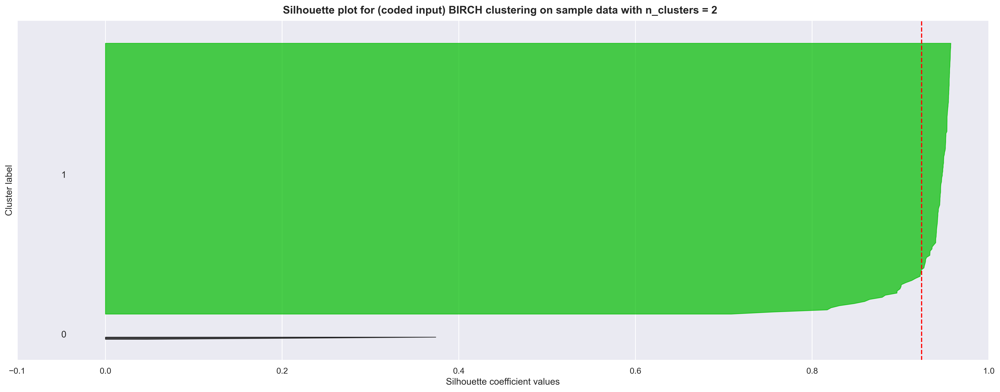

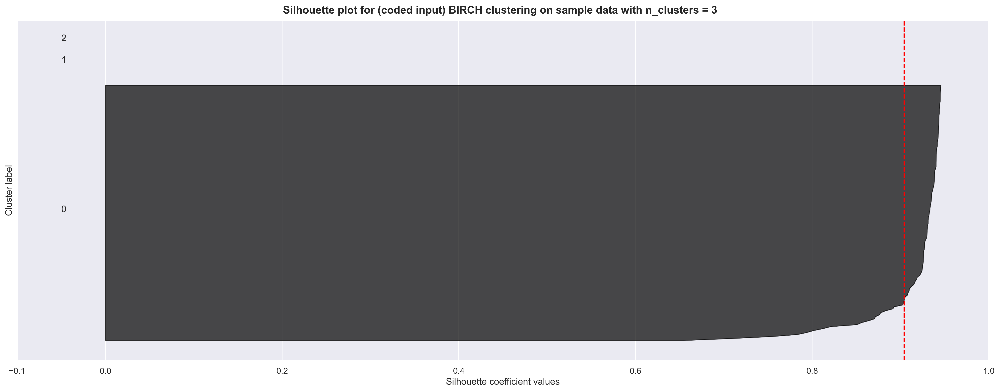

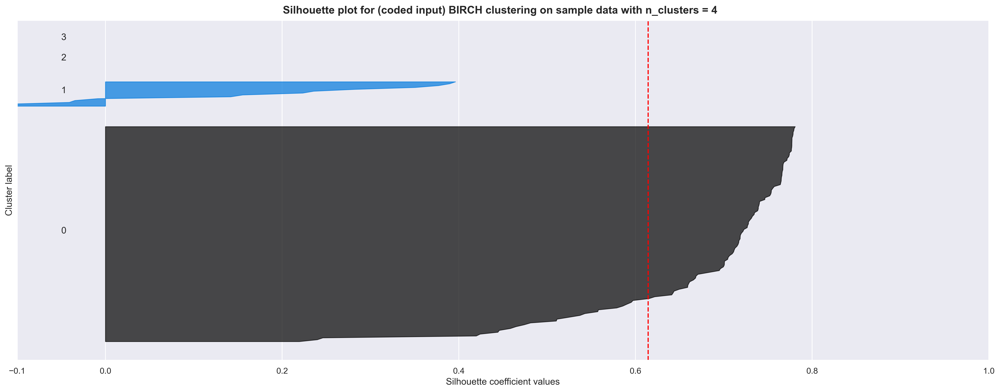

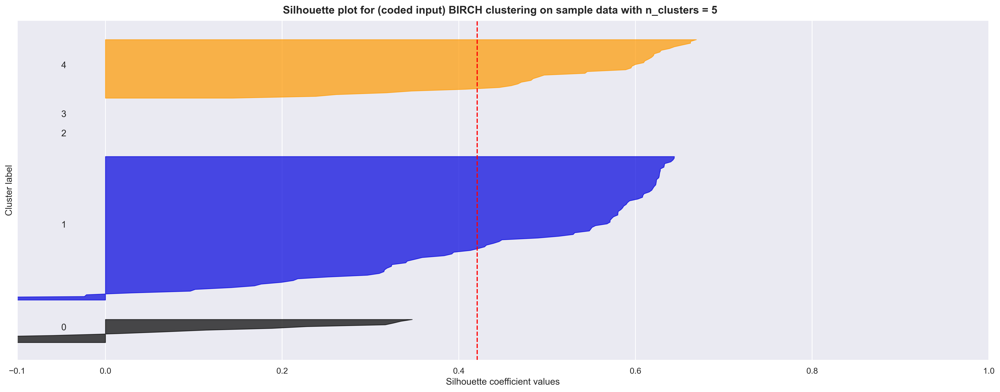

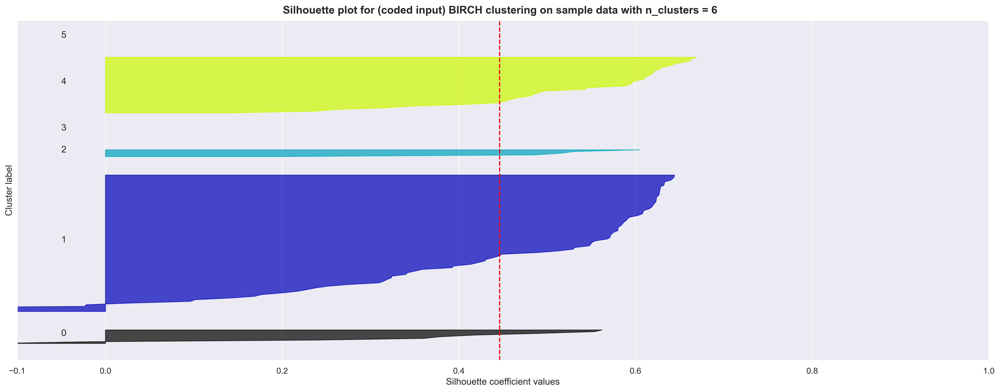

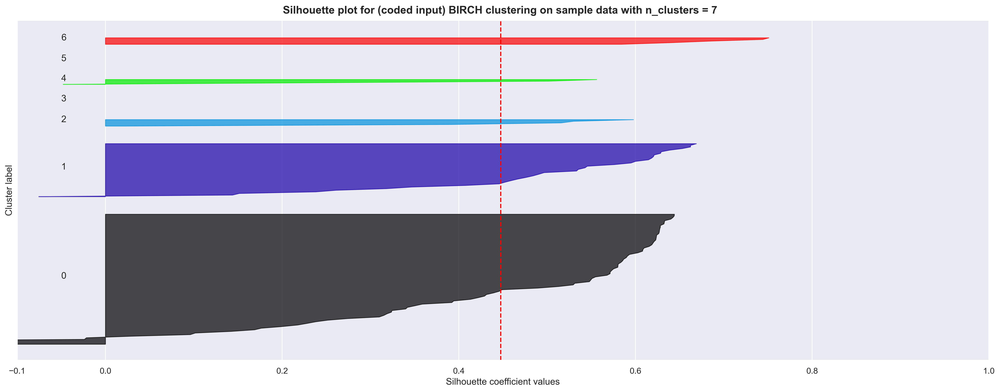

In [65]:
# Generate Silhouette scores and plot them
range_n_clusters = [2, 3, 4, 5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot. The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pcs_c_df) + (n_clusters + 1) * 10])
    
    # Initialize the clusterer with n_clusters value
    clusterer = Birch(threshold=th, branching_factor=bf, n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(pcs_c_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(pcs_c_df, cluster_labels)
    print("For n_clusters =",n_clusters,"The average silhouette_score is :",silhouette_avg,)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pcs_c_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

 # ax2 code here

    plt.suptitle(
        "Silhouette plot for (coded input) BIRCH clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [66]:
# Initialize the parameters for the model below
nc = 3   #:n_clusters - default is 3

# Use the Threshold and Branching values passed into the Coded-Silhouette plotting for consistency.

## Coded - BIRCH

In [67]:
# define the model
model = Birch(threshold=th, branching_factor=bf, n_clusters=nc)

# Create a copy of the pcs_df for processing below
b_pcs_df = pcs_c_df.copy()

# Fit the model - Make predictions
pred = model.fit_predict(b_pcs_df)

# Add the predicted class columns
b_pcs_df['class'] = model.labels_
b_pcs_df.head()

,pc1,pc2,pc3,class
country,,,,
Albania,-2.053704,-0.033280,0.331637,0
Algeria,-0.736990,0.661846,0.200031,0
Argentina,-0.162651,-0.613091,0.988171,0
Armenia,-2.071090,0.005921,0.259195,0
Australia,1.332320,-3.835108,1.423140,0


In [69]:
# Create a new DataFrame including predicted clusters and demographic features.
frames = [country_df, combined_c_df, b_pcs_df]
clustered_c_df = pd.concat(frames, axis=1, join='outer')

# Drop the string column
clustered_c_df = clustered_c_df.drop(['s1','s2','s3','s4','s5'], axis=1)

# Print the shape of the clustered_df
print(clustered_c_df.shape)
clustered_c_df

(133, 19)


,country,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018),pc1,pc2,pc3,class
country,,,,,,,,,,,,,,,,,,,
Albania,Albania,2.0,1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0,-2.053704,-0.033280,0.331637,0.0
Algeria,Algeria,1.0,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0,-0.736990,0.661846,0.200031,0.0
Argentina,Argentina,3.0,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0,-0.162651,-0.613091,0.988171,0.0
Armenia,Armenia,3.0,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0,-2.071090,0.005921,0.259195,0.0
Australia,Australia,3.0,1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0,1.332320,-3.835108,1.423140,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,Uzbekistan,2.0,6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0,-1.225975,0.896541,-0.531845,0.0
Vietnam,Vietnam,1.0,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0,0.883808,1.368645,0.298083,0.0
Yemen,Yemen,2.0,2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0,-1.426957,1.471728,-1.687944,0.0


In [71]:
clustered_c_df = clustered_c_df.dropna()

# Convert the sss_depth back to integer type
clustered_c_df = clustered_c_df.astype({'sss_depth': int})
clustered_c_df

,country,sss_depth,GDP(M$),both_sexes_lex,female_lex,male_lex,population,govt_he,private_he,govt_he_gdp,tot_alcohol_consumption,tobacco_use_%,daily plant protein (g  2013),daily animal protein (g  2013),daily calories (2018),pc1,pc2,pc3,class
country,,,,,,,,,,,,,,,,,,,
Albania,Albania,2,1.826004e+04,78.00,79.91,76.25,2.9,392.53,324.65,2.82,7.17,23.0,52.00,59.42,3360.0,-2.053704,-0.033280,0.331637,0.0
Algeria,Algeria,1,1.679831e+05,77.13,78.12,76.23,45.4,487.79,262.32,4.06,0.95,21.0,66.97,24.99,3322.0,-0.736990,0.661846,0.200031,0.0
Argentina,Argentina,3,4.914927e+05,76.58,79.50,73.51,46.0,1371.24,822.13,5.93,9.65,24.9,35.70,66.94,3307.0,-0.162651,-0.613091,0.988171,0.0
Armenia,Armenia,3,1.386118e+04,76.03,79.16,72.49,3.0,200.49,1399.60,1.41,5.55,25.8,46.79,43.25,2997.0,-2.071090,0.005921,0.259195,0.0
Australia,Australia,3,1.542660e+06,83.04,84.84,81.25,26.1,3795.18,1499.29,7.10,10.51,14.0,34.60,71.68,3391.0,1.332320,-3.835108,1.423140,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,Uzbekistan,2,6.923890e+04,73.01,75.21,70.76,34.4,173.84,243.95,2.34,2.59,17.8,54.24,29.19,3011.0,-1.225975,0.896541,-0.531845,0.0
Vietnam,Vietnam,1,3.626375e+05,73.74,78.11,69.56,99.0,244.78,308.67,2.30,8.66,25.0,50.56,31.05,3025.0,0.883808,1.368645,0.298083,0.0
Yemen,Yemen,2,2.106169e+04,66.63,68.92,64.41,31.2,11.20,90.25,0.43,0.05,20.5,45.06,13.88,2154.0,-1.426957,1.471728,-1.687944,0.0


In [72]:
# Creating a Scatter with the scale_encode_df data and the clusters
fig = px.scatter_3d(clustered_c_df, x='sss_depth', y='tot_alcohol_consumption', z='govt_he_gdp', color='class', hover_name='country', hover_data=['both_sexes_lex','population','GDP(M$)'], width=800)
fig.show()

In [73]:
# Creating a Scatter with the scale_encode_df data and the clusters
fig = px.scatter_3d(clustered_c_df, x='tot_alcohol_consumption', y='private_he', z='govt_he',size='both_sexes_lex', color='class',symbol='sss_depth', hover_name='country', hover_data=['both_sexes_lex','population','GDP(M$)'], width=800)
fig.show()

In [74]:
# Create the inference data for the autocorrelation plot
clustered_code_df = clustered_c_df.copy()

data_code = clustered_code_df[['sss_depth', 'both_sexes_lex']].values

df = pd.DataFrame({'a':data_code[:,0], 'b':data_code[:,1]})
df["chain"] = 0
df["draw"] = np.arange(len(df), dtype=int)
df = df.set_index(["chain", "draw"])
xdata = xr.Dataset.from_dataframe(df)

dataset_code = az.InferenceData(posterior=xdata)
dataset_code

Inference data with groups:
	> posterior

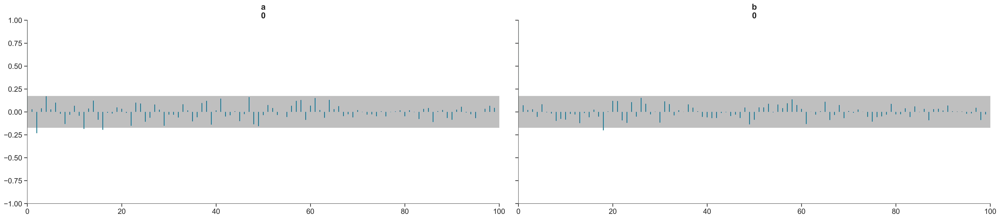

In [75]:
# Create an autocorrelation plot
az.style.use("arviz-doc")

az.plot_autocorr(dataset_code, var_names=('a', 'b'))

plt.show()

In [76]:
# Create a hvplot.scatter plot.
sizez = clustered_c_df['sss_depth'] * 30

clustered_c_df.hvplot.scatter(x='class', y='both_sexes_lex', size=sizez, label='Coded BIRCH', hover_cols=['country'], line_color='#c994c7', hover_line_color='magenta', by='class')

:NdOverlay   [class]
   :Scatter   [class]   (both_sexes_lex,_size,country)

In [77]:
# Create a hvplot.scatter plot.
sizez = clustered_c_df['sss_depth'] * 30

clustered_c_df.hvplot.scatter(x='tot_alcohol_consumption', y='both_sexes_lex', size=sizez, label='Coded BIRCH', hover_cols=['country'], line_color='#c994c7', hover_line_color='magenta', by='class')

:NdOverlay   [class]
   :Scatter   [tot_alcohol_consumption]   (both_sexes_lex,_size,country)

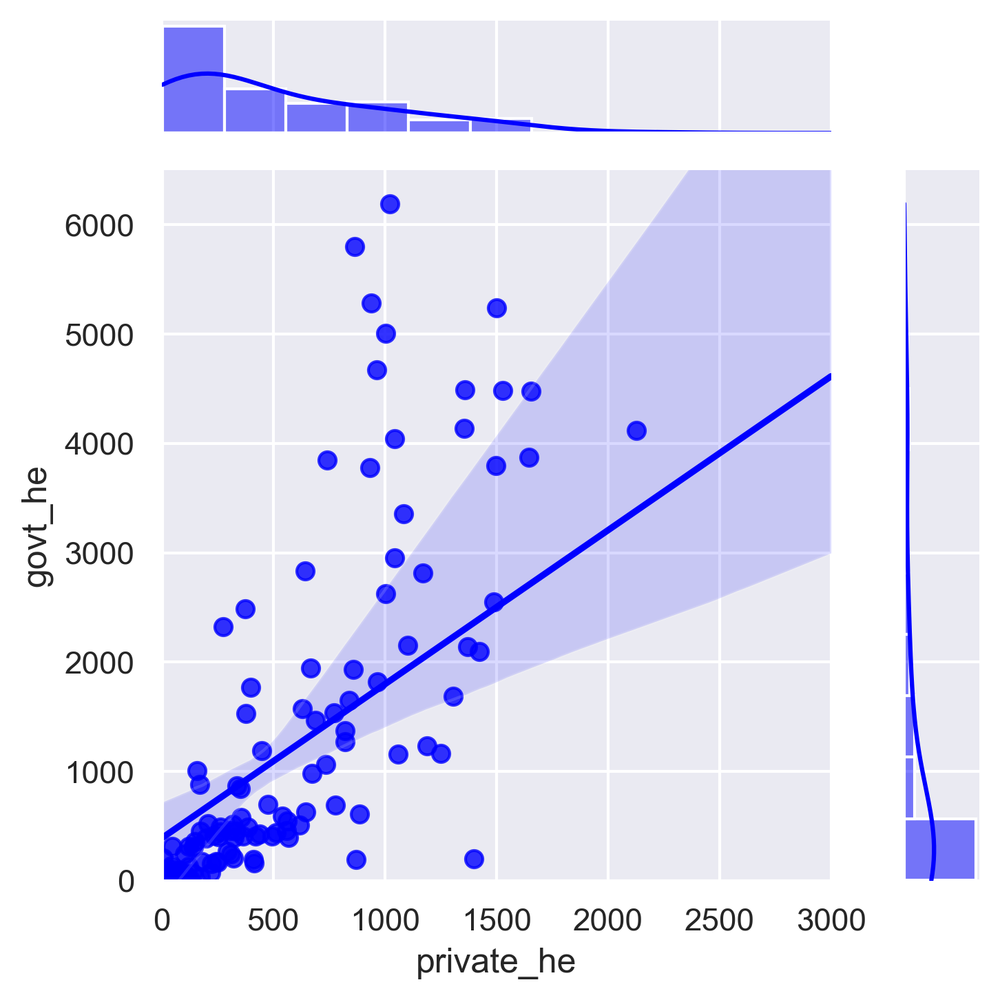

In [78]:
sns.set_theme(style="darkgrid")

g = sns.jointplot(x='private_he', y='govt_he', data=clustered_c_df,
                  kind="reg", truncate=False,
                  xlim=(0, 3000), ylim=(0, 6500),
                  color='blue', height=5)

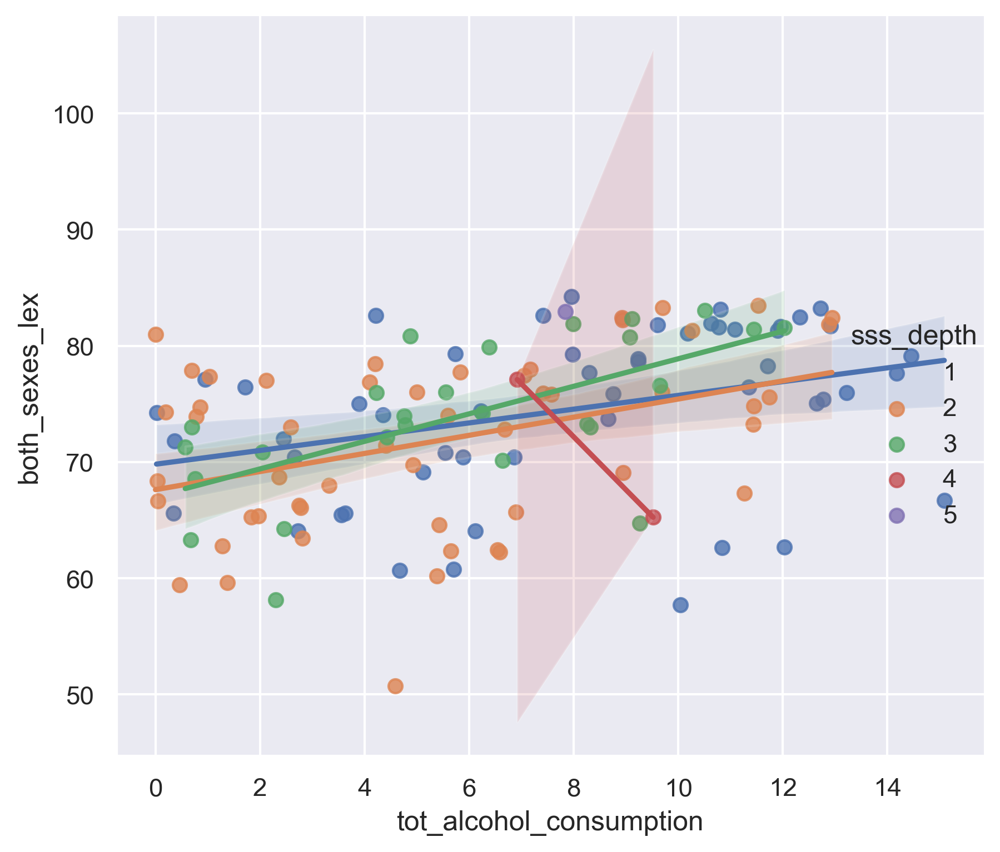

In [79]:
sns.set_theme(style="darkgrid")

# Plot 
g = sns.lmplot(
    data=clustered_c_df,
    x='tot_alcohol_consumption', y='both_sexes_lex', hue='sss_depth',
    height=5
)

# Use more informative axis labels than are provided by default
g.set_axis_labels('tot_alcohol_consumption', 'both_sexes_lex')

array([<AxesSubplot: title={'center': 'a'}>,
       <AxesSubplot: title={'center': 'b'}>], dtype=object)

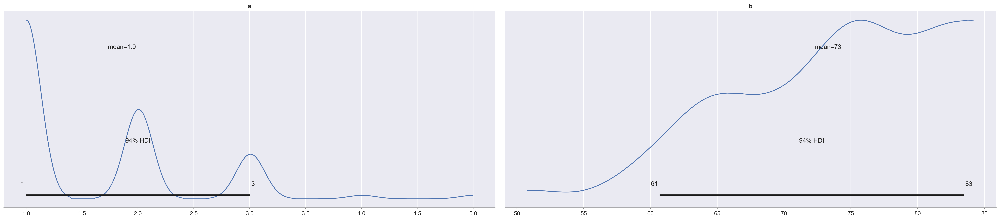

In [80]:
az.plot_posterior(dataset_list)

array([<AxesSubplot: title={'center': 'a'}>,
       <AxesSubplot: title={'center': 'b'}>], dtype=object)

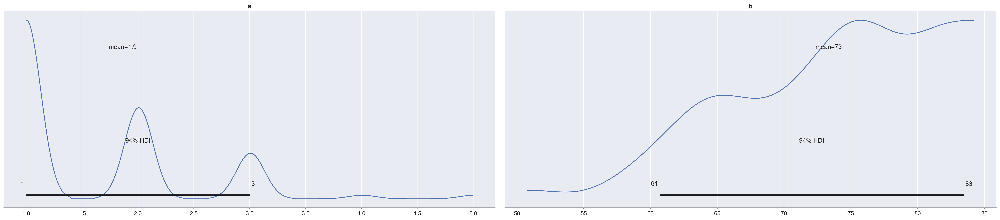

In [81]:
az.plot_posterior(dataset_code)

<AxesSubplot: title={'center': 'a'}>

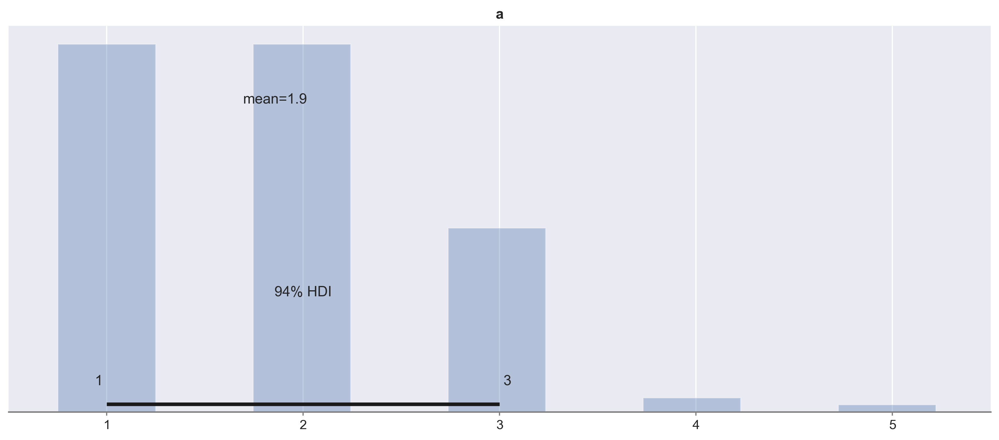

In [82]:
az.plot_posterior(dataset_list, var_names=['a'], kind='hist')

<AxesSubplot: title={'center': 'a'}>

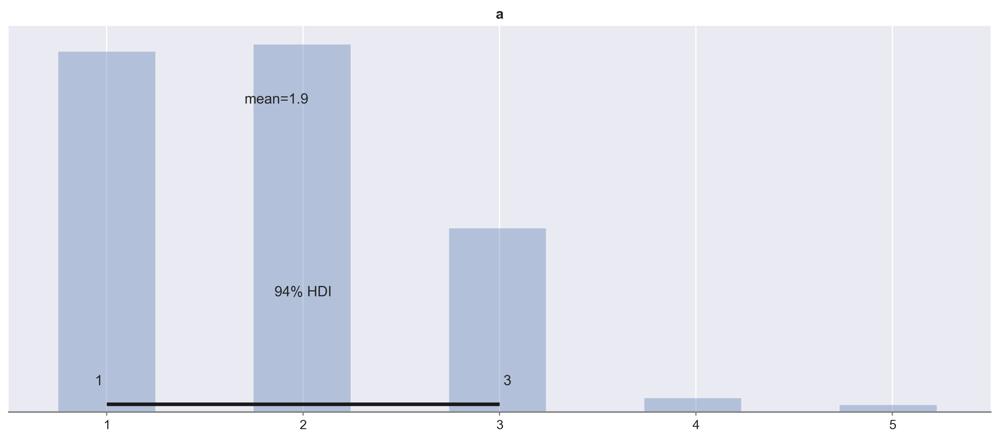

In [83]:
az.plot_posterior(dataset_code, var_names=['a'], kind='hist')

<AxesSubplot: title={'center': 'b'}>

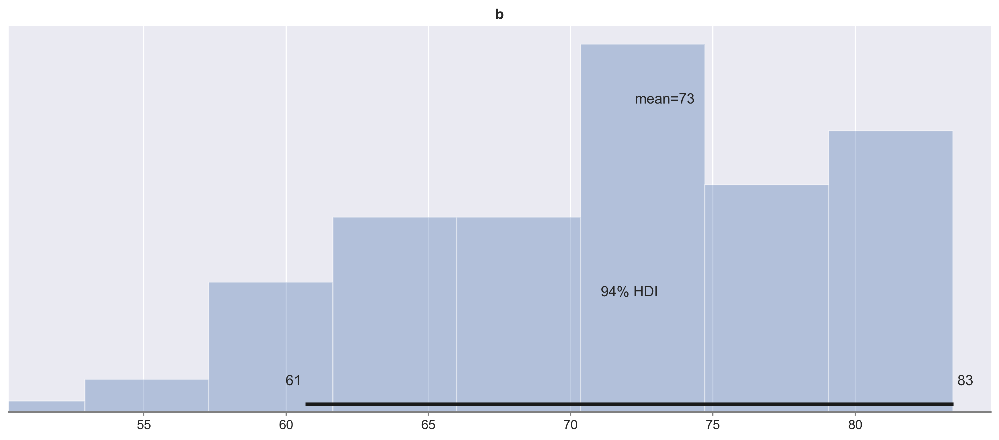

In [84]:
az.plot_posterior(dataset_list, var_names=['b'], kind='hist')

<AxesSubplot: title={'center': 'b'}>

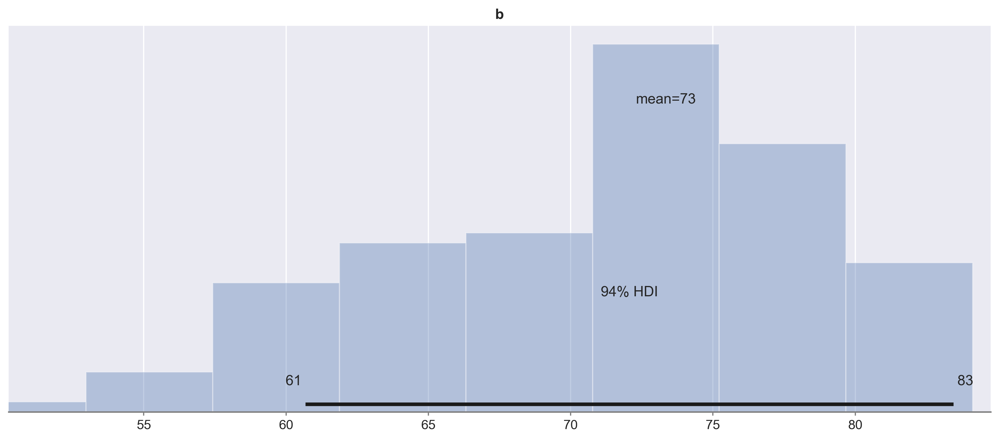

In [85]:
az.plot_posterior(dataset_code, var_names=['b'], kind='hist')

## Comparison plots